
# Lab 2 point operations and Histograms

### Function definitions

First, we will perform the required imports.

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

Next, is a function that translates the amplitude of an image to a logarithmic scale. For any pixel with a magnitude of $x$, we will convert using $log_{10}(x+1)$. Since we expect the Fourier transform to output complex values, we will use `abs()` to calculate the magnitude. 

In [3]:
def logarithmic_display_of_image(img):
  return np.log10(np.abs(img)+1)

We will need a function that can display the result of the conversion function. mind, that presented values should be in the interval $[0,255]$.

In [4]:
def present_image(img, title, xlabel = '', ylabel = ''):
  # convert each of the RGB chnnels to the correct dynamic range:
  img = (((img-np.min(img))/np.max(img))* 255).astype(int);
  # Plot:
  plt.figure(figsize=(16,8));
  plt.imshow(img, cmap="gray");
  plt.title(title);
  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.show();


And now, we load the image, perform the Fourier transform, and display the result for analysis. 

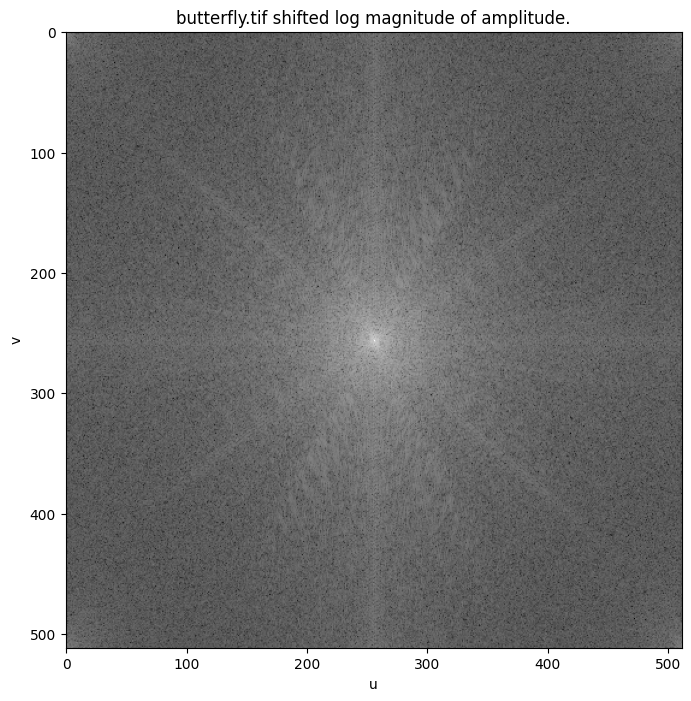

In [5]:
# Load image in a gray scale format
I1 = cv2.imread('butterfly.tif', cv2.IMREAD_GRAYSCALE);
# Debug options:
# print(I1.shape);
# plt.imshow(I1);

# Perfrom the Furier tranform and shift the result
I1_f = np.fft.fft2(I1);
fshift = np.fft.fftshift(I1_f);
# Convert to log scale and present the output
log_image = logarithmic_display_of_image(fshift);
title = 'butterfly.tif shifted log magnitude of amplitude.';
present_image(log_image,title, 'u', 'v');

We can see that the characteristics of the image are a very strong DC\constant value (the bright dot in the center), with most of the energy concentrated on the low frequencies around the center. We will now proceed to inverse the shifted-back transfer to see if we get the same image. 

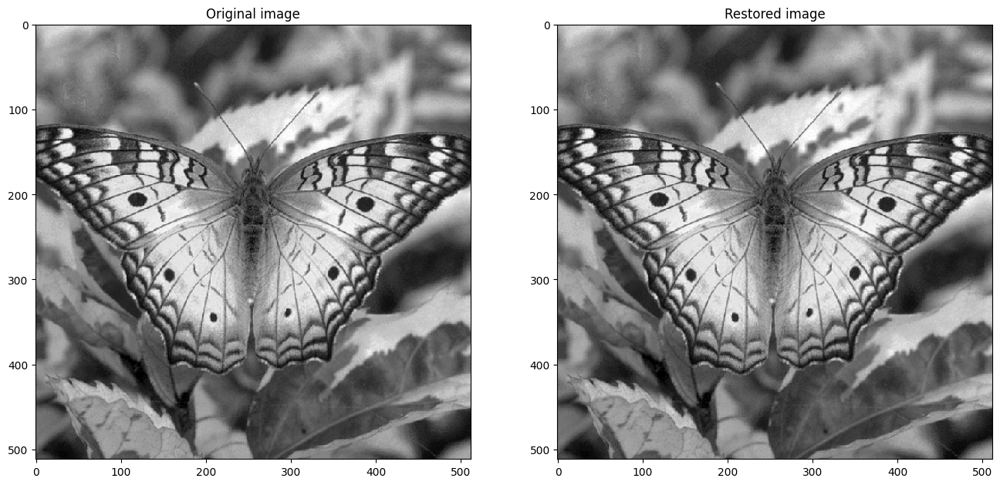

In [6]:
I1_f_ishift = np.fft.ifftshift(fshift);
restored_img = np.fft.ifft2(I1_f_ishift);
plt.figure(figsize=(16,8));
plt.subplot(121);
title = 'Original image';
plt.imshow(I1, cmap="gray");
plt.title(title);
plt.subplot(122);
title = 'Restored image';
plt.imshow(abs(restored_img), cmap="gray");
plt.title(title);
plt.show();



We have restored the original image using an inverse shift and an inverse transform. We will create a function to split a given image using masks. We will start from the largest mask, and subtract each mask from the former mask in each iteration that is not the first one. 

In [7]:
def mask_split(I):
  w = 512;
  m,n = I.shape;
  masks = np.zeros((m,n,3));
  output_images = np.zeros((m,n,3),dtype = np.complex64);
  ps = 0;
  for i in range(3):
    masks[:,:,i] =  cv2.copyMakeBorder(np.ones((w,w), dtype=int), ps, ps, ps, ps, cv2.BORDER_CONSTANT, 0);
    if i!=0:
      masks[:,:,i-1] = cv2.bitwise_xor(masks[:,:,i],masks[:,:,i-1]);
    w -= 200;
    ps += 100;
  
  # Apply masks to input images:
  # It would have been more efficient to do this in a single loop. However, we split the operation for code readability
  for i in range(3):
    output_images[:,:,i] = I*(masks[:,:,2-i]).astype(np.complex64);# Note that multiplying against the mask, without casting to complex first my diminish the complex component
  return output_images
  



Now, we will load the 'face.png' image and perform fft and fft shift. We will proceed to apply all three masks to the resulting representation in the frequency domain, and present the results:


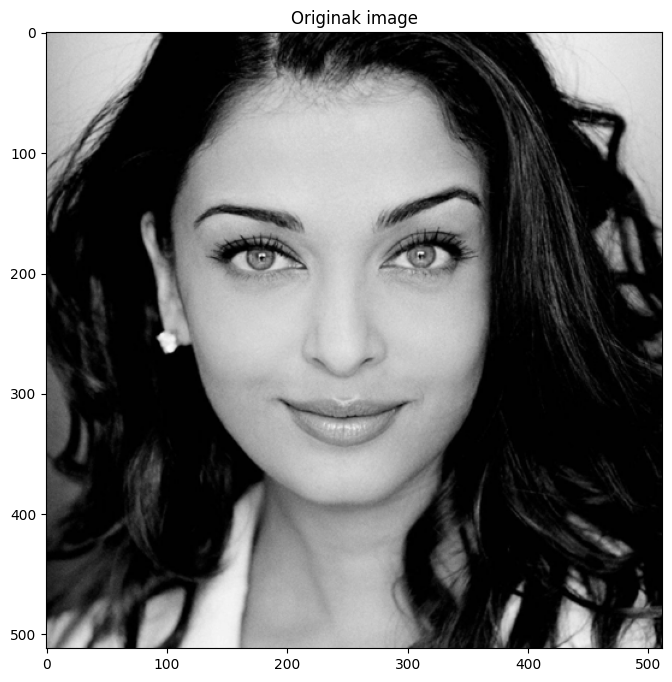

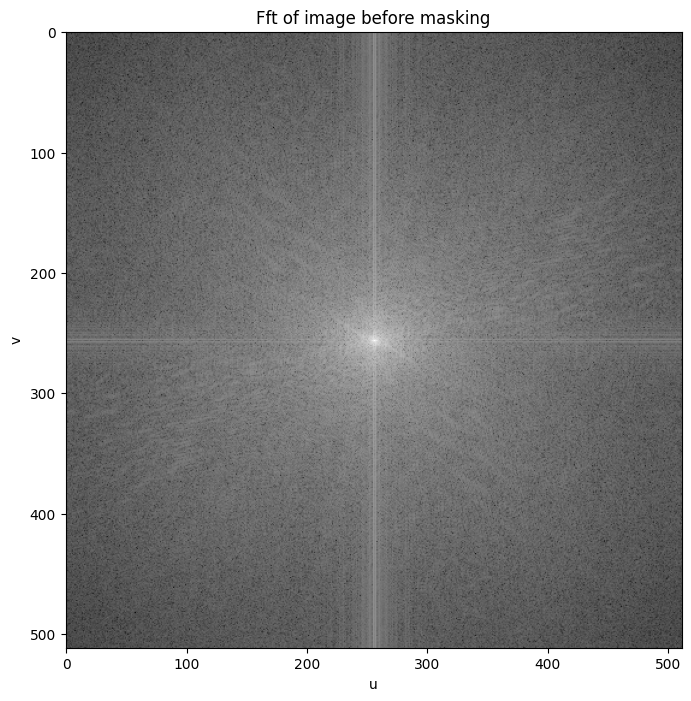

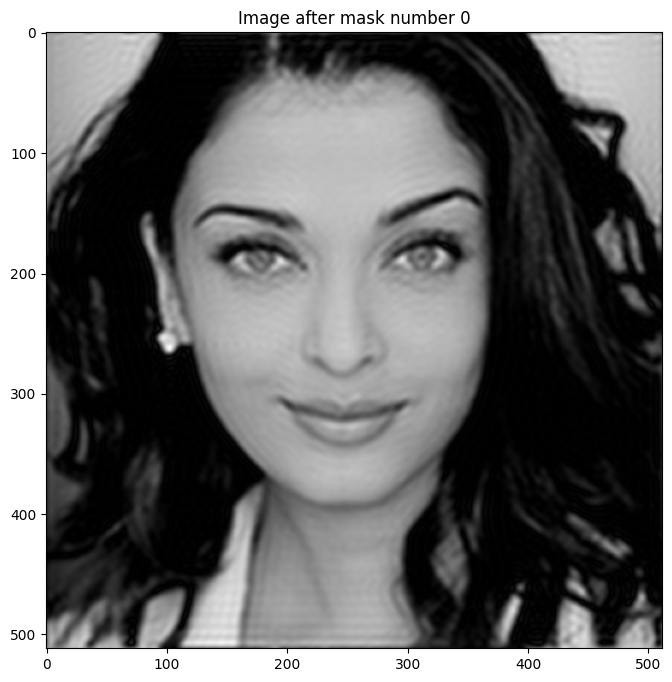

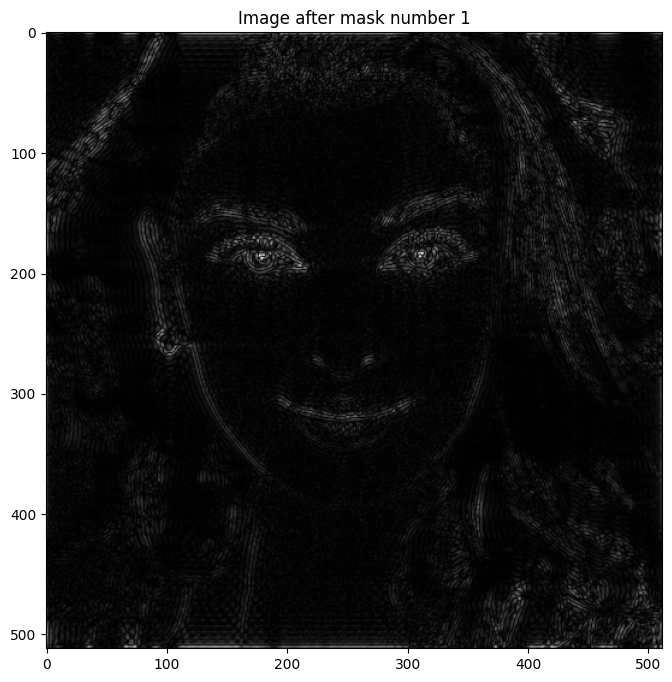

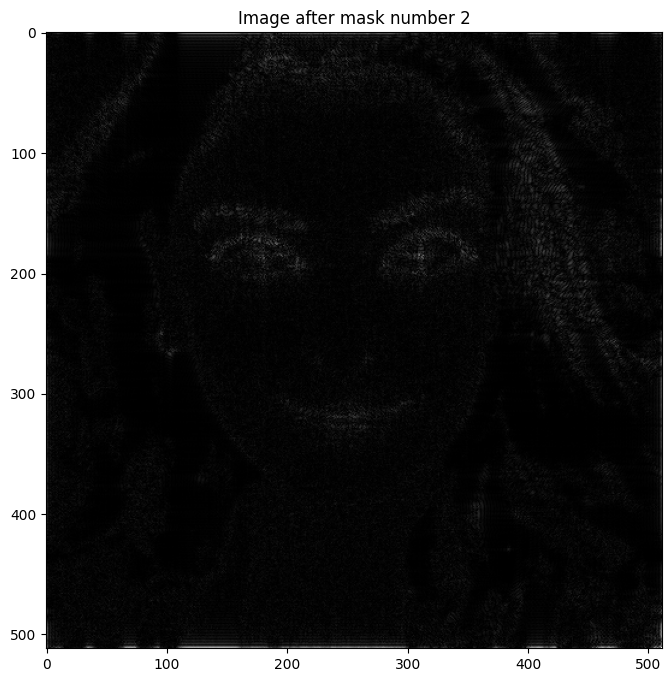

In [8]:
# Load image in a gray scale format
I2 = cv2.imread('face.png', cv2.IMREAD_GRAYSCALE);
plt.figure(figsize=(16,8));
title = 'Originak image';
plt.imshow(I2, cmap="gray");
plt.title(title);
plt.show();

# Perfrom the Furier tranform and shift the result
I2_f = np.fft.fft2(I2);
fshift = np.fft.fftshift(I2_f);
present_image(logarithmic_display_of_image(fshift), "Fft of image before masking", 'u', 'v');

masked_images = mask_split(fshift);

for i in range(3):
  I2_f_ishift = np.fft.ifftshift(masked_images[:,:,i]);
  restored_image = np.fft.ifft2(I2_f_ishift);
  title = f"Image after mask number {i}";
  present_image(abs(restored_image),title);


We can see that the first mask (the small square), acts as a low pass filter. It is keeping most of the information, but for the small and sharp details. It is a blurred version of the original image holding only the low frequencies. 

The second mask is a bandpass filter. We can recognize the general outline of the face. these are the relatively low-frequency edges of the face. The last filter is a high pass filter, yielding  relatively high-frequency edges. 

The low frequencies contain most of the picture's information. However, the edges are very important for some uses. Answering which of the frequencies is more important will highly depend on the purpos. 

We will now experiment with additive noise. 

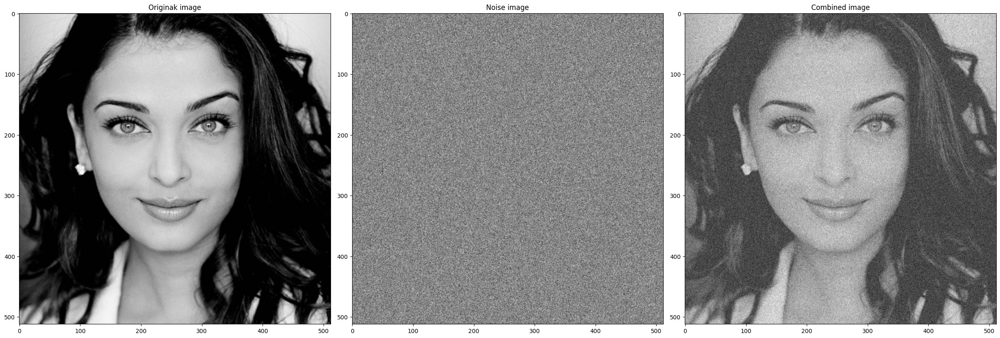

In [9]:
# Create gaussian image:
m,n= I2.shape;
mean = 0;
var = 0.01;
sigma = var**0.5;
gauss = np.random.normal(mean,sigma,(m,n));
I2_noisy = I2 + 255*gauss;
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = 'Originak image';
axs[0].imshow(I2, cmap="gray");
axs[0].set_title(title);
title = 'Noise image';
axs[1].imshow(gauss, cmap="gray");
axs[1].set_title(title);
title = 'Combined image';
axs[2].imshow(I2_noisy, cmap="gray");
axs[2].set_title(title);
plt.show();

Now, we extract the fft, and apply the LPF mask. We will creat and altered version of the filtering function, with a single mask and control over the $w$ value. We will also create a second version of the 'present_image()' function, such that it will return a presentable image instead of showing it. 

In [10]:
def HPF(I,w):
  m,n = I.shape;
  ps = int((m-w)/2);
  mask =  cv2.copyMakeBorder(np.ones((w,w), dtype=int), ps, ps, ps, ps, cv2.BORDER_CONSTANT, 0);
  return I*mask.astype(np.complex64);

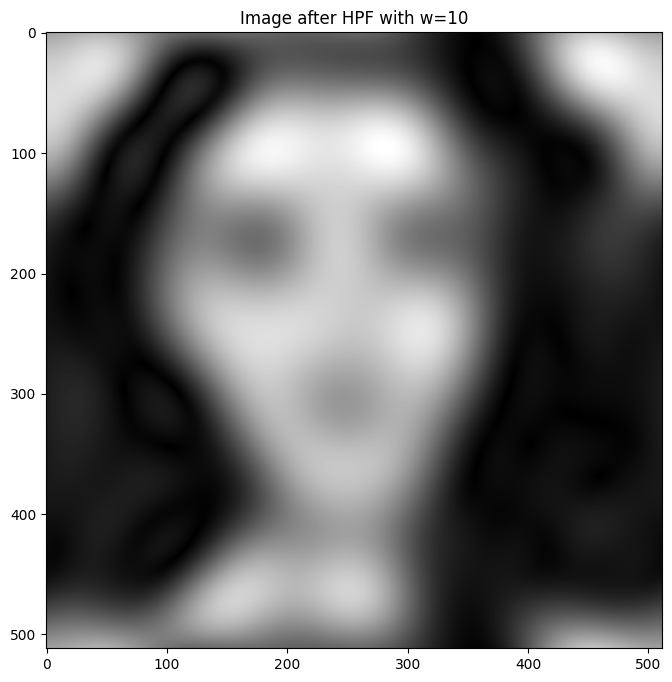

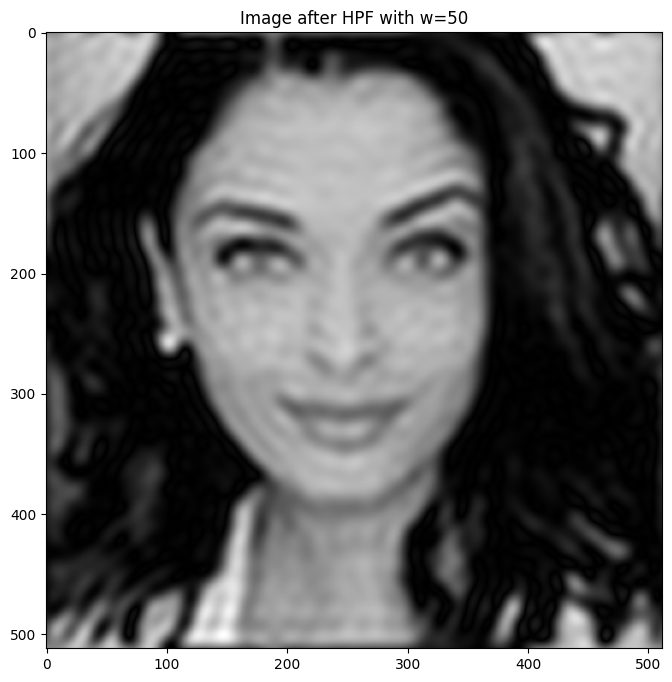

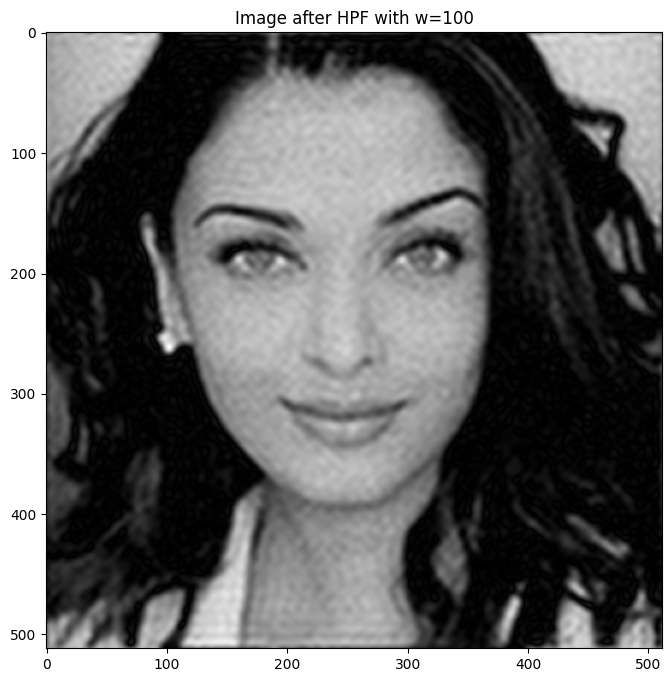

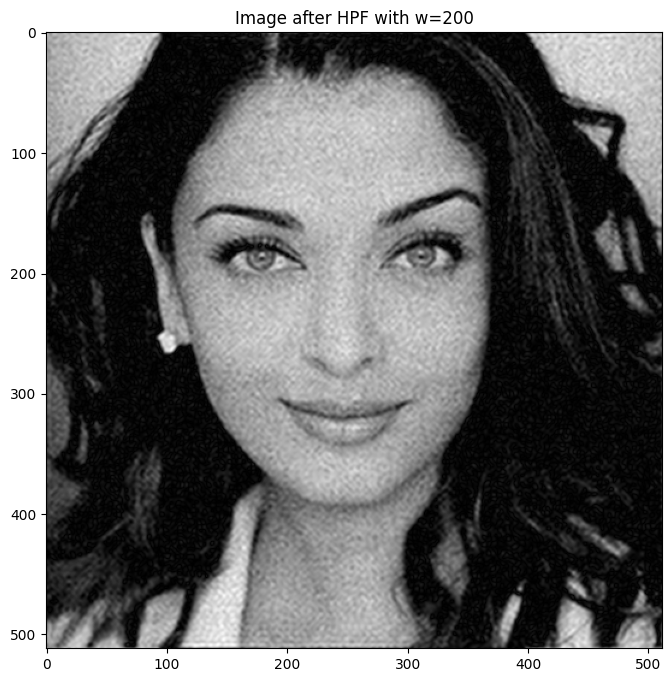

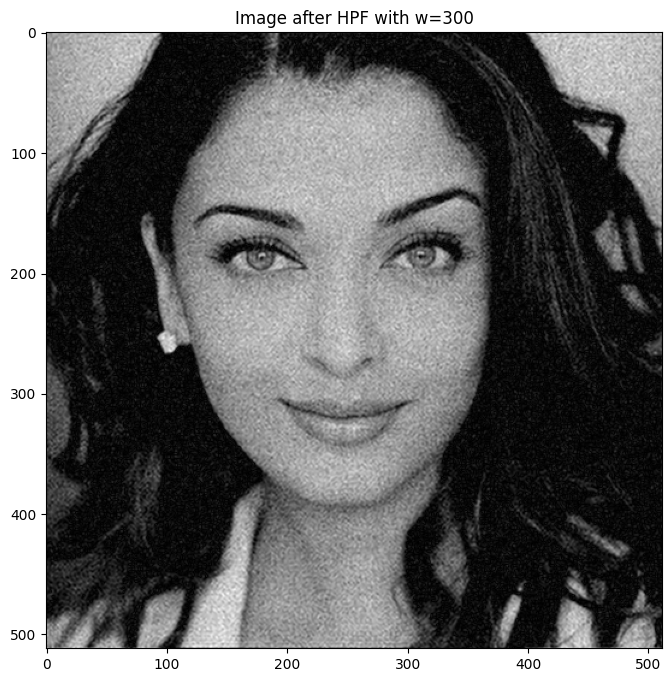

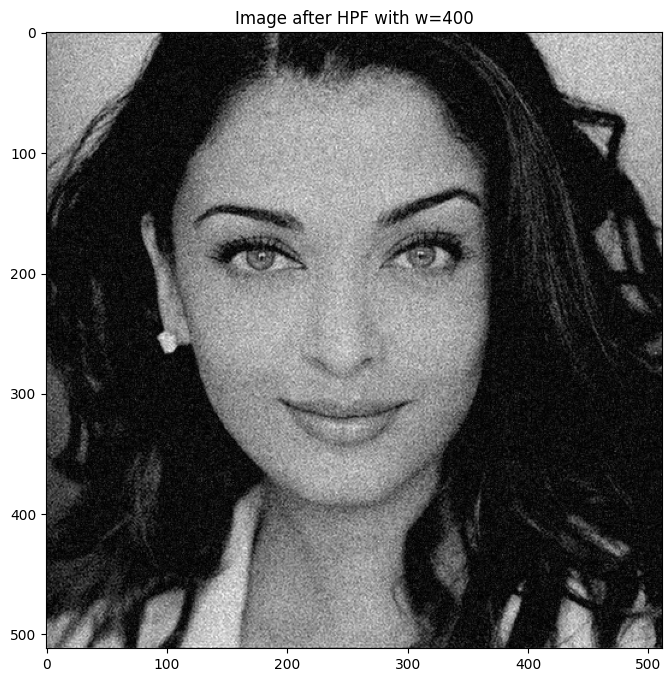

In [11]:
# Perfrom the Furier tranform and shift the result
I2_f = np.fft.fft2(I2_noisy);
fshift = np.fft.fftshift(I2_f);


for w in [10,50,100,200,300,400]:
  masked_img = HPF(fshift,w);
  I2_f_ishift = np.fft.ifftshift(masked_img);
  restored_image = np.fft.ifft2(I2_f_ishift);
  title = f"Image after HPF with w={w}";
  present_image(abs(restored_image),title);

While a very low $w$ value, loses too much image information (note $w=10$), a high value  of $w$ does poor work of filtering the noise (note $w=400$). The best results seem to be around $w=[100,220]$. We will repeat the operation with a higher resolution on the area:

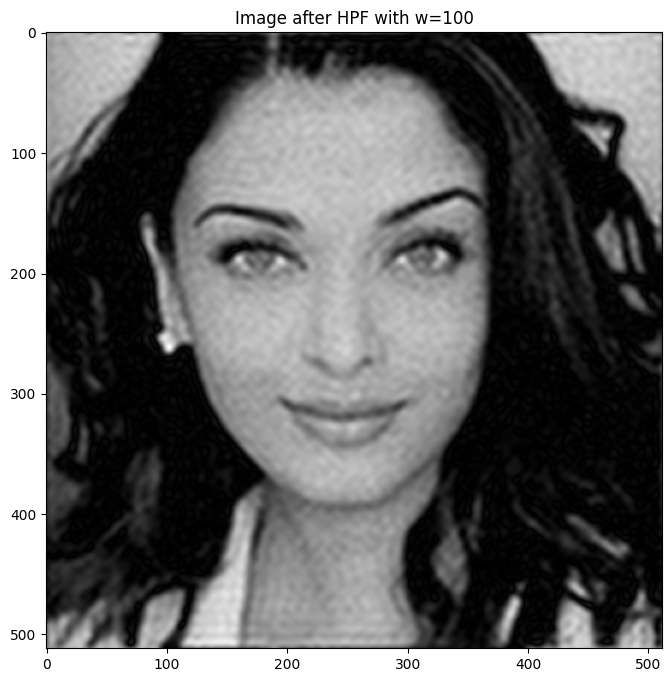

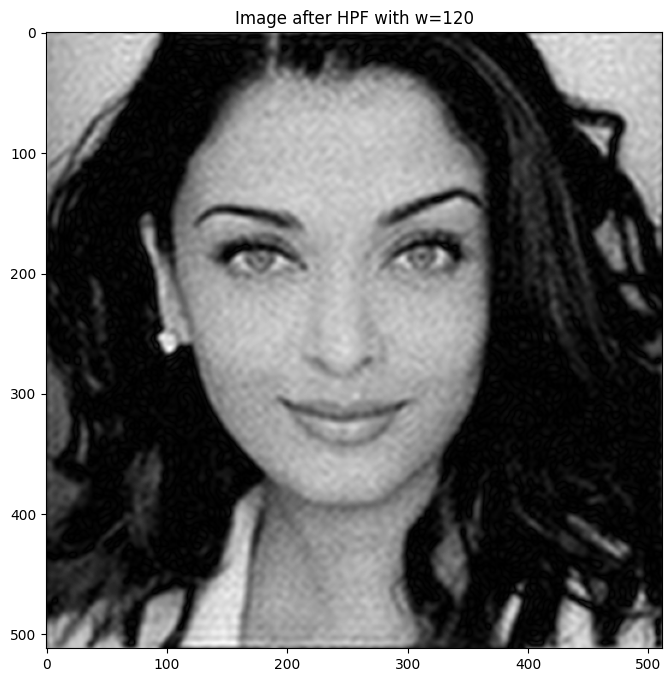

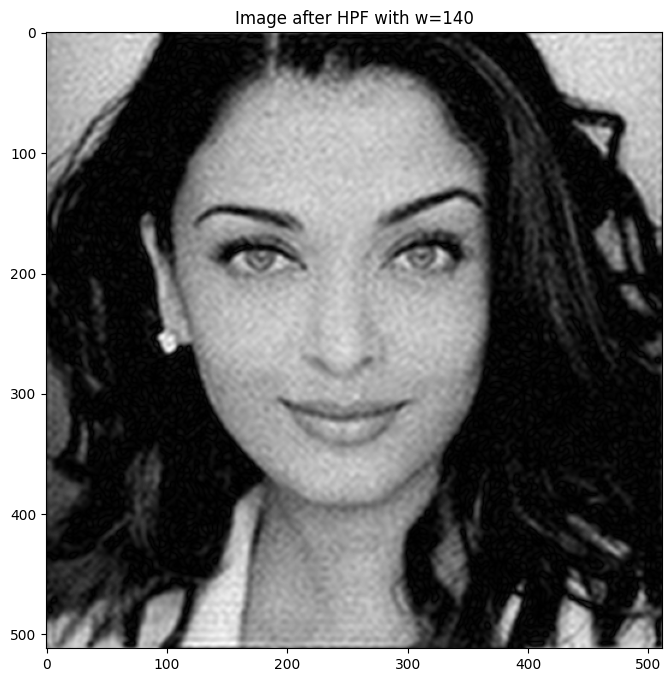

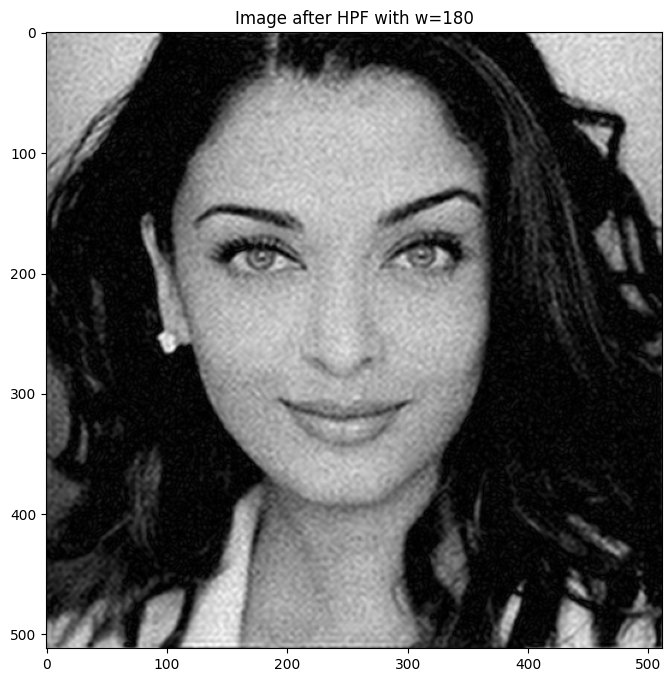

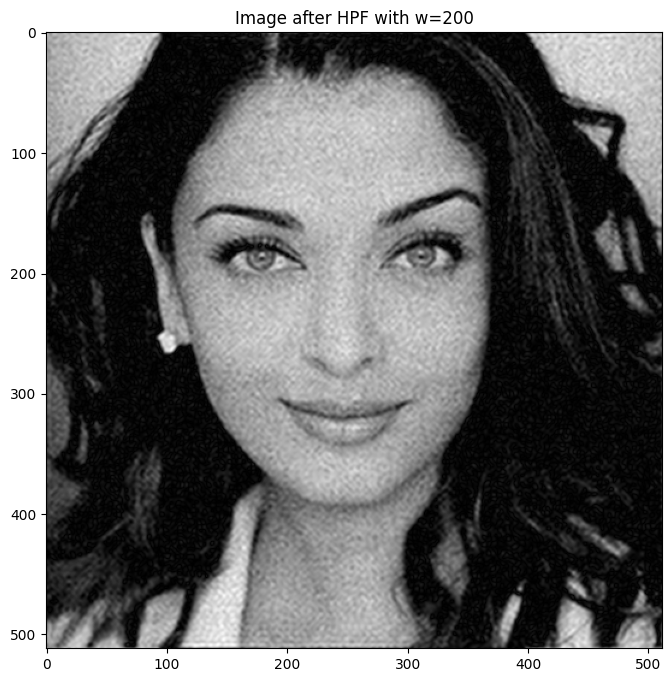

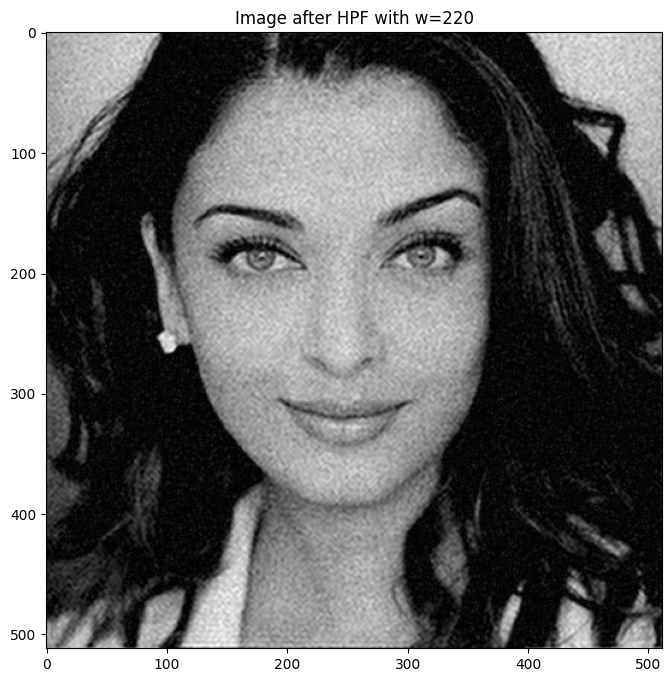

In [12]:
for w in [100,120,140,180,200,220]:
  masked_img = HPF(fshift,w);
  I2_f_ishift = np.fft.ifftshift(masked_img);
  restored_image = np.fft.ifft2(I2_f_ishift);
  title = f"Image after HPF with w={w}";
  present_image(abs(restored_image),title);

While somewhat subjective, the best result seems to be in the area of $w=120$. We will repeat it with a higher resolution. We will keep on diving deeper and set the best looking $w$.

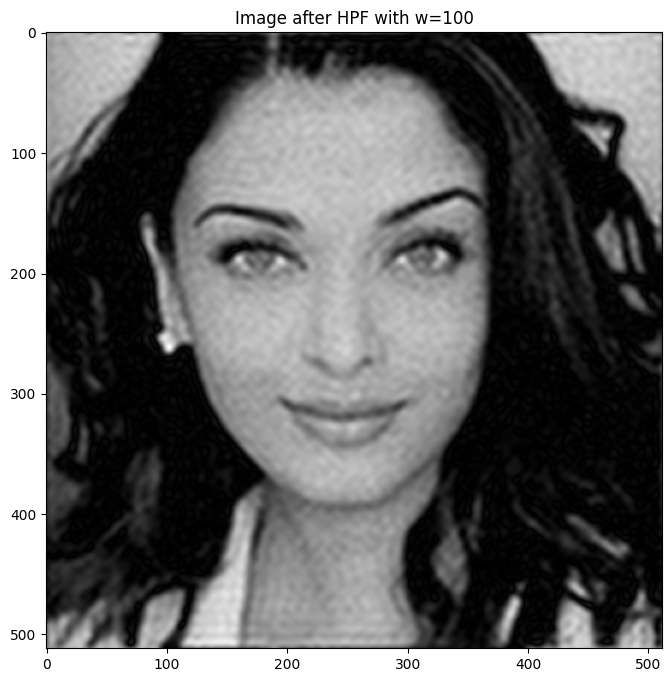

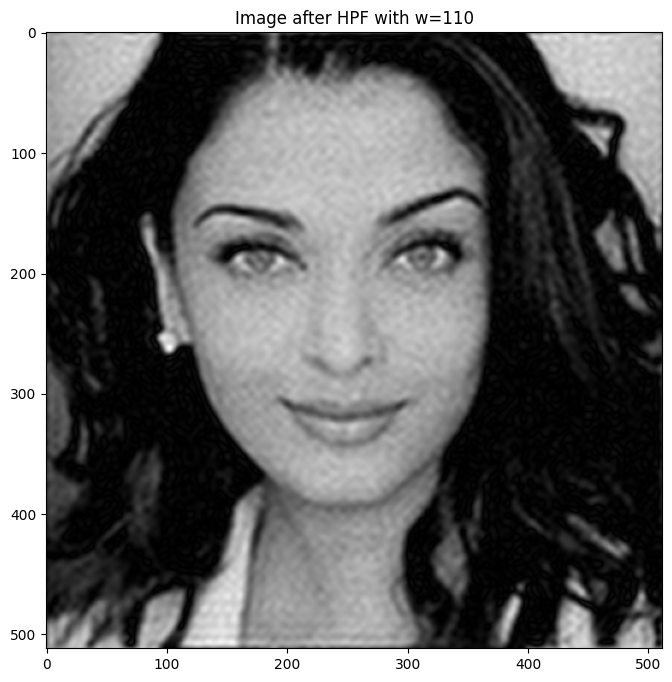

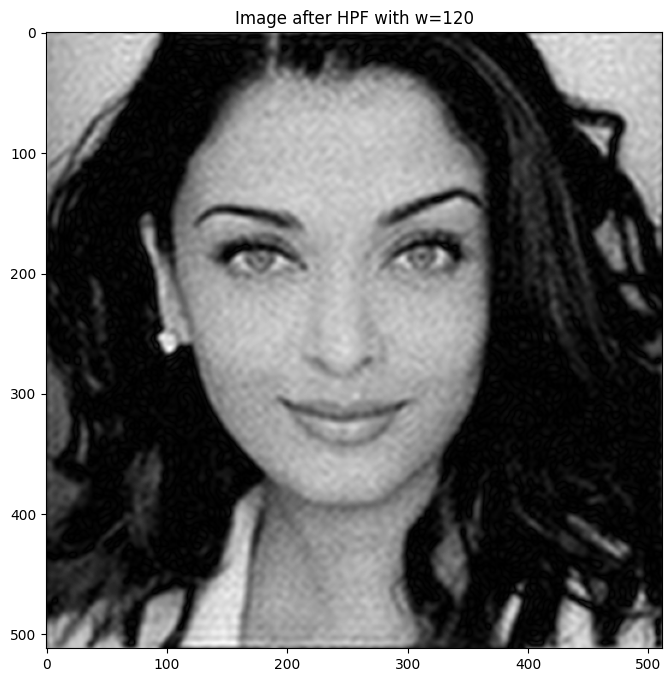

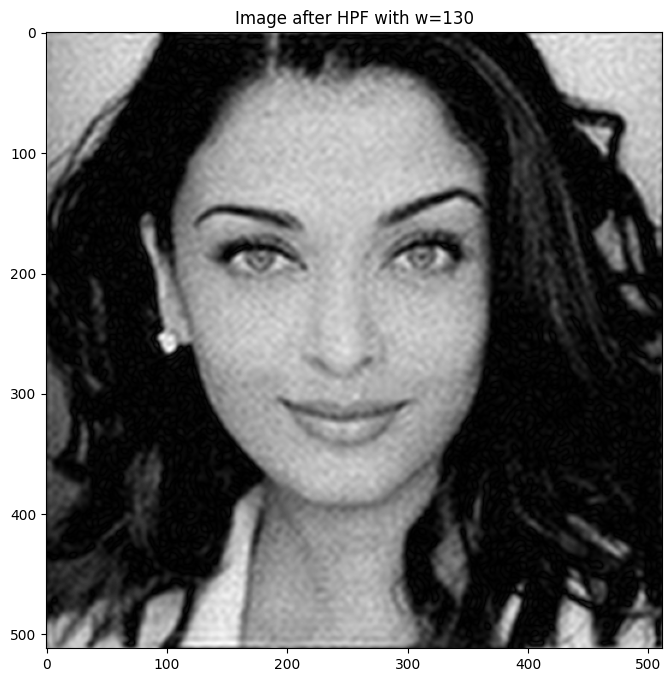

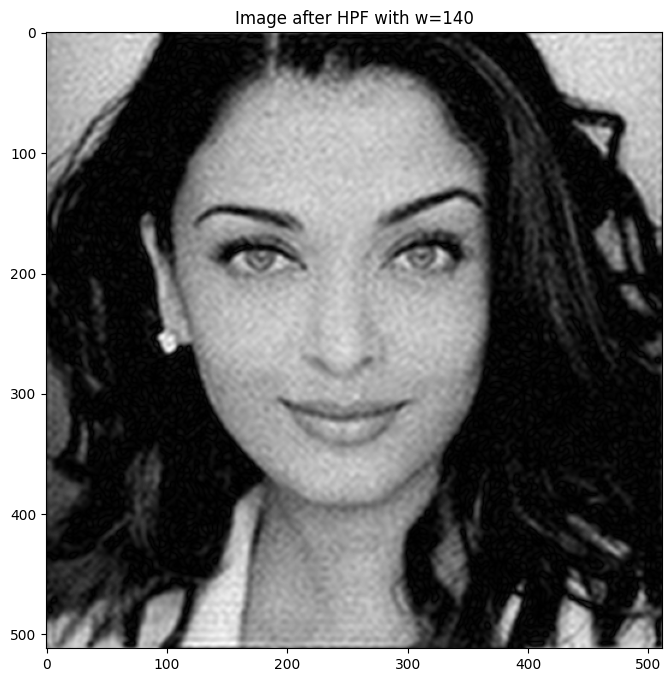

In [13]:
for w in [100,110,120,130,140]:
  masked_img = HPF(fshift,w);
  I2_f_ishift = np.fft.ifftshift(masked_img);
  restored_image = np.fft.ifft2(I2_f_ishift);
  title = f"Image after HPF with w={w}";
  present_image(abs(restored_image),title);

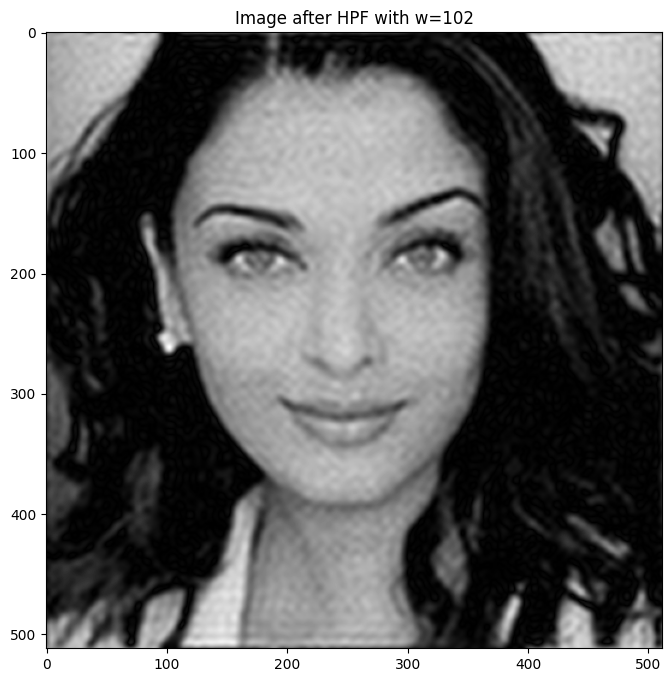

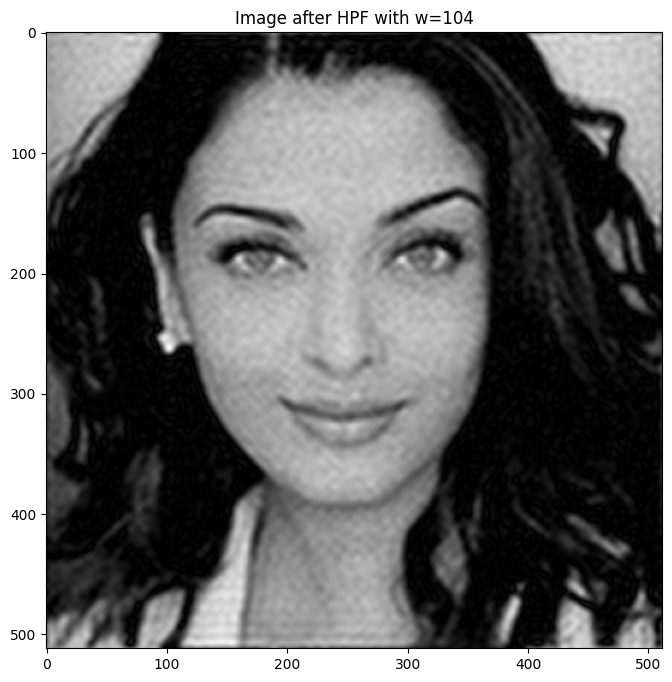

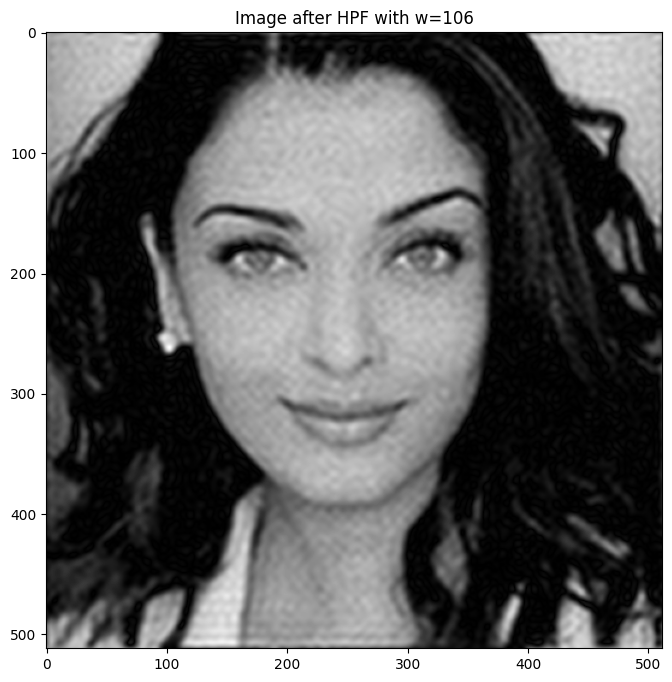

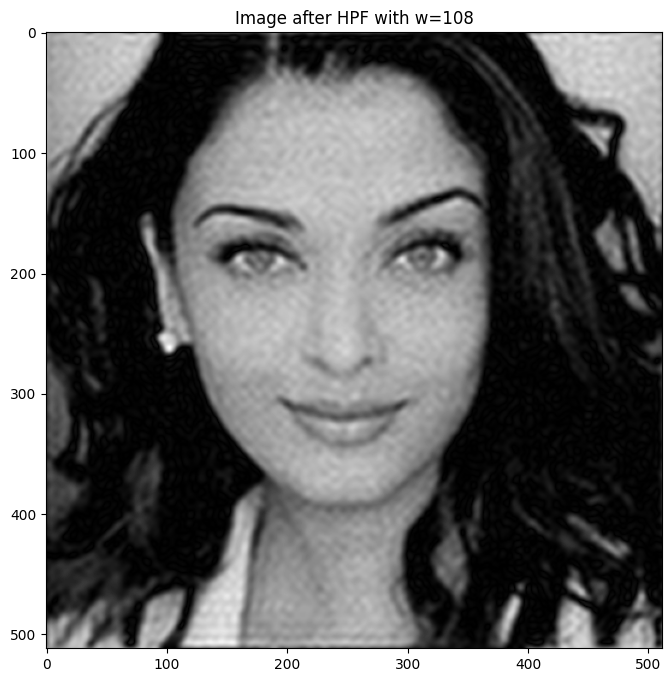

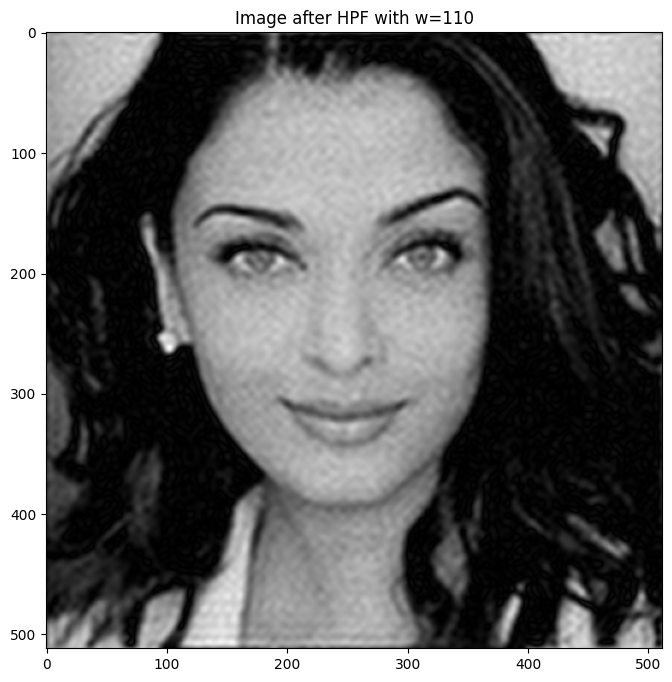

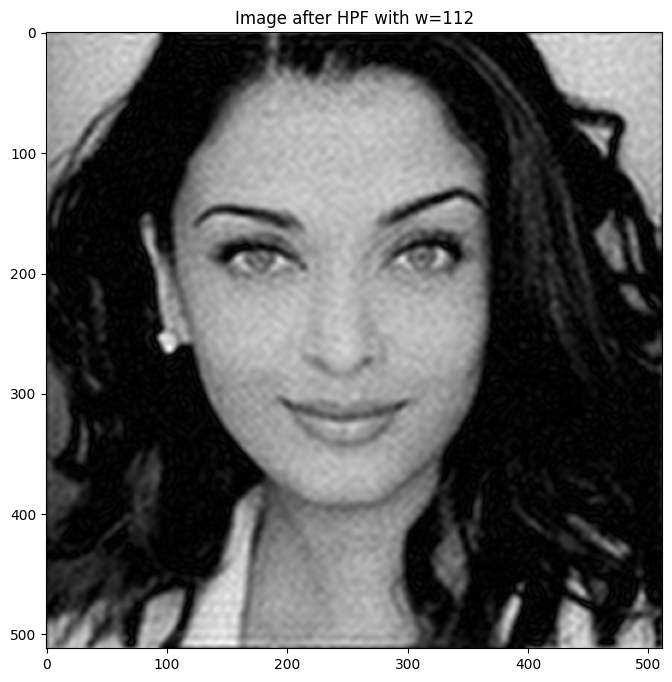

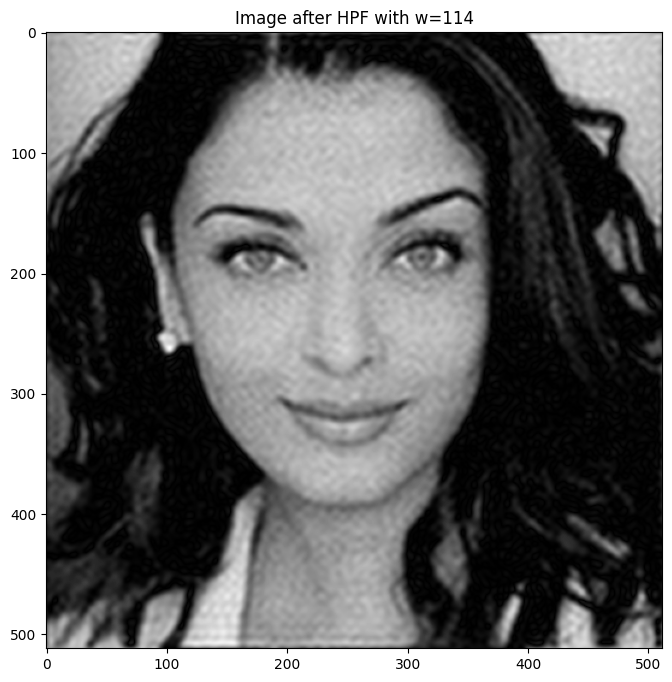

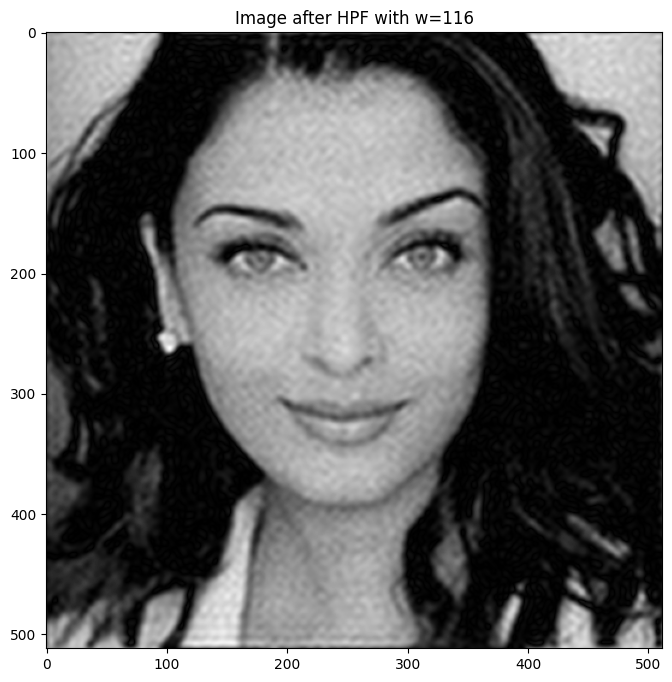

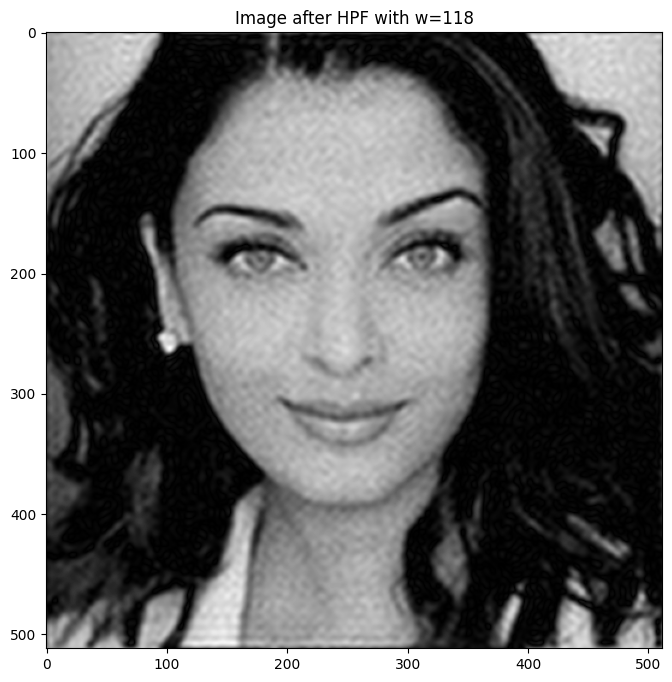

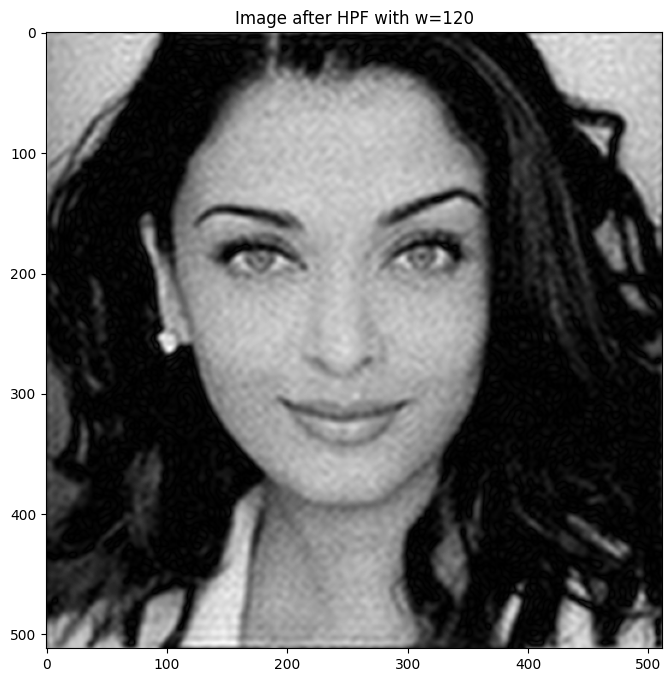

In [14]:
for w in [102,104,106,108,110,112,114,116,118,120]:
  masked_img = HPF(fshift,w);
  I2_f_ishift = np.fft.ifftshift(masked_img);
  restored_image = np.fft.ifft2(I2_f_ishift);
  title = f"Image after HPF with w={w}";
  present_image(abs(restored_image),title);

The choice of $w$ here is with respect to observant behavior. There is no correct answer. The technique is very easy and fast to implement. However, the results are not perfect. The noise cannot be reduced such that it is unnoticed while keeping a sharp image. This method requires a trade-off and an expirianced operator to set the correct value of $w$.